# Spotify Challenge - Clustering songs- Unsupervised Learning

🎯 The goal of this recap is to **cluster songs** using the **KMeans _(clustering algorithm)_** with a **PCA _(dimensionality reduction)_**

In [1]:
# Data Manipulation
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

# Data Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Pipeline and Column Transformers
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn import set_config
set_config(display = "diagram")

# Scaling
from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler

# Cross Validation
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_predict

# Unsupervised Learning
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans 

# STATISTICS
from statsmodels.graphics.gofplots import qqplot
# This function plots your sample against a Normal distribution, 
# to see whether your sample is normally distributed or not

## (1) The Spotify Dataset

In [2]:
from sklearn.utils import shuffle

spotify = shuffle(pd.read_csv('https://wagon-public-datasets.s3.amazonaws.com/Machine%20Learning%20Datasets/ML_spotify_data.csv'))
spotify.head()

,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo
8333,Use Me,['Miguel'],43,0.432,0.540,0.867,0,9,0.247,-6.809,0.0593,79.995
2067,Into Money,"['Robin Trower', 'Jack Bruce', 'Bill Lordan']",23,0.612,0.801,0.842,0,1,0.175,-9.296,0.0464,128.159
1033,Move Me No Mountain,['Dionne Warwick'],30,0.422,0.608,0.803,0,5,0.108,-6.014,0.0690,175.188
8482,"There, There",['The Wonder Years'],47,0.399,0.353,0.737,0,8,0.204,-6.411,0.0408,120.123
7460,White Lines (Long Version) [Re-Recorded],['Grandmaster Flash & The Furious Five'],45,0.814,0.786,0.701,0,7,0.132,-7.525,0.0376,114.998


### (1.1) Basic Info

In [3]:
spotify.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 8333 to 7413
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   name          10000 non-null  object 
 1   artists       10000 non-null  object 
 2   popularity    10000 non-null  int64  
 3   danceability  10000 non-null  float64
 4   valence       10000 non-null  float64
 5   energy        10000 non-null  float64
 6   explicit      10000 non-null  int64  
 7   key           10000 non-null  int64  
 8   liveness      10000 non-null  float64
 9   loudness      10000 non-null  float64
 10  speechiness   10000 non-null  float64
 11  tempo         10000 non-null  float64
dtypes: float64(7), int64(3), object(2)
memory usage: 1015.6+ KB


### (1.2) Working on the numerical features

🔢  Let's focus on the numerical features:

In [4]:
spotify_num = spotify.select_dtypes(exclude = ['object'])
spotify_num

,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo
8333,43,0.432,0.540,0.867,0,9,0.247,-6.809,0.0593,79.995
2067,23,0.612,0.801,0.842,0,1,0.175,-9.296,0.0464,128.159
1033,30,0.422,0.608,0.803,0,5,0.108,-6.014,0.0690,175.188
8482,47,0.399,0.353,0.737,0,8,0.204,-6.411,0.0408,120.123
7460,45,0.814,0.786,0.701,0,7,0.132,-7.525,0.0376,114.998
...,...,...,...,...,...,...,...,...,...,...
4840,34,0.303,0.517,0.898,0,7,0.103,-4.214,0.0342,175.125
540,28,0.352,0.378,0.300,0,11,0.219,-12.007,0.0301,124.357
4154,31,0.970,0.631,0.578,1,6,0.368,-14.512,0.1870,113.010
9357,56,0.609,0.380,0.431,0,9,0.181,-11.516,0.0675,125.117


### (1.3) Correlations between features

፨ Visualize the correlation matrix (`PuRd` is a nice cmap choice)

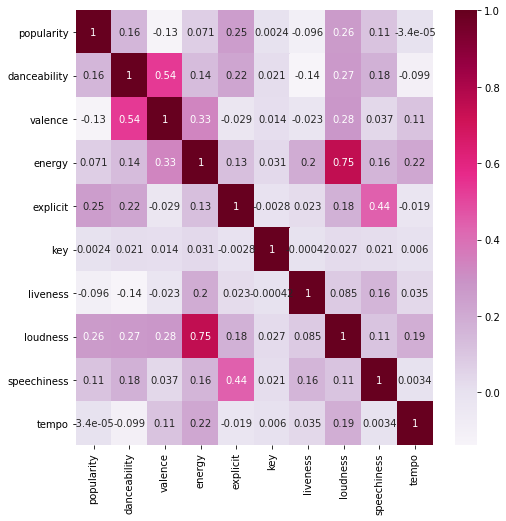

In [5]:
plt.figure(figsize=(8,8))

sns.heatmap(spotify_num.corr(),
            annot = True,
            annot_kws = {"fontsize":10},
            cmap='PuRd');

### (1.4) 3D Visualisation

🎨 Let's select 3 features of these songs and visualise them in a 3D-scatter-plot `plotly`:

In [6]:
fig = px.scatter_3d(spotify_num, 
                    x = 'danceability',
                    y = 'energy',
                    z = 'speechiness',
                    opacity=0.7, width=500, height=500
           )
fig.show()

🎯 _Remember: our goal is to cluster these songs_

## (2) Unsupervised Learning: Clustering

### (2.1) Vanilla KMeans

💫 Let's try our first _Unsupervised Algorithm_ 

❓ Fit a `kmeans_vanilla` model directly on our `spotify_num`, keeping default number of clusters
- store its predicted labels in variable `labels_vanilla`

In [10]:
kmeans_vanilla=KMeans(n_clusters=8)
kmeans_vanilla.fit(spotify_num)
labels_vanilla=kmeans_vanilla.labels_

In [11]:
fig = px.scatter_3d(spotify_num, 
                    x = 'danceability',
                    y = 'energy',
                    z = 'speechiness',
                    color = labels_vanilla, width=500, height=500)
fig.show()

😭 It doesn't look good at all... who would pay 10-15 euros a month to Spotify, Apple Music, Deezer, Amazon Music or Tidal for that ?

### (2.2) Scaling + KMeans

🪜 Remember that the KMeans is a distance-based algorithm and that for any Machine Learning model, we should scale the features so that they start with an "equal chance" of impacting the predictions.

👇 Let's take a short approach to scaling and Robust Scale everything. 

In [12]:
scaler = RobustScaler()
spotify_scaled = pd.DataFrame(scaler.fit_transform(spotify_num), columns=spotify_num.columns)
spotify_scaled

,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo
0,0.368421,-0.498008,0.036131,0.648579,0.0,0.571429,0.705109,0.311161,0.328704,-0.882935
1,-0.684211,0.219124,0.644522,0.583979,0.0,-0.571429,0.274873,-0.085079,0.030093,0.226368
2,-0.315789,-0.537849,0.194639,0.483204,0.0,0.000000,-0.125486,0.437824,0.553241,1.309530
3,0.578947,-0.629482,-0.399767,0.312661,0.0,0.428571,0.448163,0.374572,-0.099537,0.041284
4,0.473684,1.023904,0.609557,0.219638,0.0,0.285714,0.017927,0.197084,-0.173611,-0.076753
...,...,...,...,...,...,...,...,...,...,...
9995,-0.105263,-1.011952,-0.017483,0.728682,0.0,0.285714,-0.155363,0.724608,-0.252315,1.308079
9996,-0.421053,-0.816733,-0.341492,-0.816537,0.0,0.857143,0.537795,-0.517008,-0.347222,0.138801
9997,-0.263158,1.645418,0.248252,-0.098191,1.0,0.142857,1.428145,-0.916116,3.284722,-0.122541
9998,1.052632,0.207171,-0.336830,-0.478036,0.0,0.571429,0.310726,-0.438780,0.518519,0.156305


❓ Fit the same default KMeans model number and compare results visually

In [15]:
kmeans_scaled=KMeans(n_clusters=8)
kmeans_scaled.fit(spotify_scaled)

KMeans()

In [16]:
labels_scaled = kmeans_scaled.labels_
labels_scaled

array([0, 5, 4, ..., 7, 0, 0], dtype=int32)

🧪Okay, our songs'clustering look better even if we can't rival yet with the datascience team at Spotify!

In [17]:
fig_scaled = px.scatter_3d(spotify_scaled,
                           x = 'danceability',
                           y = 'energy',
                           z = 'speechiness',
                           color = labels_scaled,
                           width=500, height=500)
fig_scaled.show()

🤪 It is a bit better but still messy...besides, we are only looking at one specific a 3D slice of our dataset here!

### (2.3) Scaling + PCA + KMeans

🧑🏻‍🏫 What if we perform a PCA before running our clustering algorithm ? We could:
* reduce dimensionality to get better visual feedback on our clustering
* use the orthogonality of the principal components so that the KMeans algorithm increases its clustering power

❓ Fit a PCA and reduce dimension appropriately using the elbow method

In [19]:
pca = PCA()
spotify_proj=pca.fit_transform(spotify_scaled)

❓ Project your $ 10000 \times 10$ `spotify_num_scaled` dataset into this new space with the number of principal components you decided to keep. Name it `spotify_proj`

In [ ]:
# YOUR CODE HERE

In [20]:
fig_scaled = px.scatter_3d(spotify_proj, x = 0, y = 1, z = 2, opacity=0.7, width=500, height=500)
fig_scaled.show()

❓ Let's try a KMeans now

In [23]:
kmeans_vanilla=KMeans(n_clusters=8)
kmeans_vanilla.fit(spotify_proj)
labels_kmeans_pca=kmeans_vanilla.labels_

In [24]:
fig_scaled = px.scatter_3d(spotify_proj,
                           x = 0, 
                           y = 1,
                           z = 2,
                           color = labels_kmeans_pca,
                          width=500, height=500)
fig_scaled.show()

### (2.4) Ideal number of clusters ? 

<details>
    <summary><i>Are there some number of clusters useless to try ? </i></summary>

* $K = 1$ means that you would have only 1 cluster with the whole dataset of $10000$ songs
* $K = 10000$ means that each of the $10000$ songs would be its own cluster!
* $K = 2$ means that you would have only 2 clusters with $5000$ songs each...
    
        
</details>        

In [25]:
nb_clusters_to_try = np.arange(1,20+1,1)
nb_clusters_to_try

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20])

❓ How would you decide on the number of cluster to use ?

<details>
    <summary markdown='span'>Answer</summary>

Compare each model's inertia:
    
= sum of squared distances of each observations to their closest centroids  
= sum of within-cluster sum of squares (WCSS)
</details>

In [26]:
# Apply the elbow method to find the optimal number of clusters.

wcss = []

for K in nb_clusters_to_try:
    print('working with ' + str(K) + ' clusters...', flush=True)
    kmeans = KMeans(n_clusters = K)
    kmeans.fit(spotify_proj)
    wcss.append(kmeans.inertia_)
print("DONE !")

working with 1 clusters...
working with 2 clusters...
working with 3 clusters...
working with 4 clusters...
working with 5 clusters...
working with 6 clusters...
working with 7 clusters...
working with 8 clusters...
working with 9 clusters...
working with 10 clusters...
working with 11 clusters...
working with 12 clusters...
working with 13 clusters...
working with 14 clusters...
working with 15 clusters...
working with 16 clusters...
working with 17 clusters...
working with 18 clusters...
working with 19 clusters...
working with 20 clusters...
DONE !


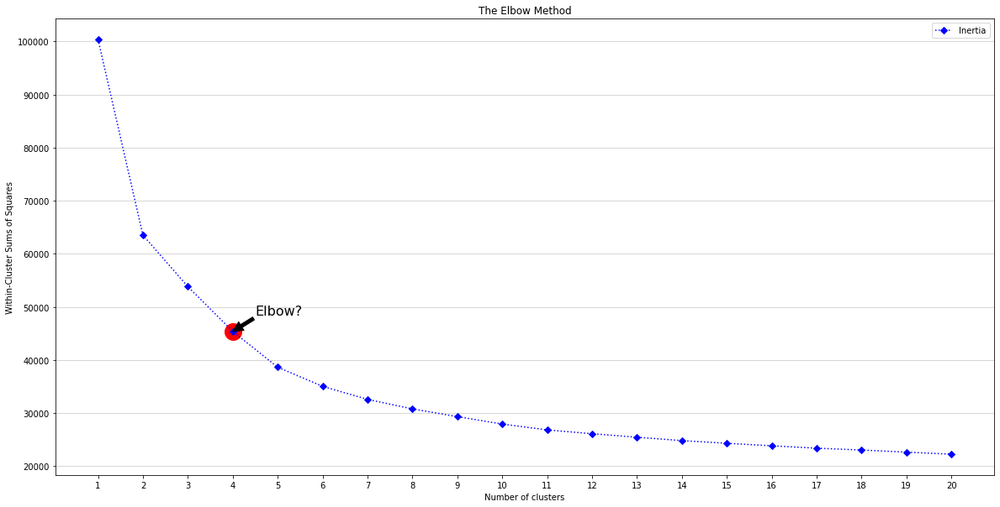

In [27]:
elbow_highlight = 4
with plt.style.context('seaborn-deep'):
    # figsize
    plt.figure(figsize=(20,10))
    # getting axes
    ax = plt.gca()
    # plotting
    ax.plot(nb_clusters_to_try, wcss,color="blue",linestyle=":",marker="D",label="Inertia")
    # customizing
    ax.legend(loc="upper right")
    ax.set_title('The Elbow Method')
    ax.set_xticks(nb_clusters_to_try)
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Within-Cluster Sums of Squares')
    ax.scatter(elbow_highlight,wcss[elbow_highlight-1],c='red',s=400)    
    # annotate
    ax.annotate("Elbow?", 
                (elbow_highlight,wcss[elbow_highlight-1]),
                (elbow_highlight+0.50,wcss[elbow_highlight-1]+5000), 
                arrowprops=dict(facecolor='black'),
                fontsize=16,
#                horizontalalignment='middle', 
                verticalalignment='top')
    
    ax.grid(axis="y",linewidth=0.5)
    plt.show()

### (2.5) Spotify : 4 daily mixes

In [28]:
spotify_clusters = 4

print('Working with ' + str(spotify_clusters) + ' clusters as in Spotify', flush=True)
print("-"*80)

kmeans = KMeans(n_clusters = spotify_clusters, max_iter = 300)

kmeans.fit(spotify_proj)

labelling = kmeans.labels_

fig_scaled = px.scatter_3d(spotify_proj,
                           x = 0,
                           y = 1,
                           z = 2,
                           color=labelling, width=500, height=500)
fig_scaled.show()

Working with 4 clusters as in Spotify
--------------------------------------------------------------------------------


In [29]:
spotify_labelled = pd.concat([spotify,pd.Series(labelling)],axis=1).rename(columns={0:"label"})
spotify_labelled

,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
0,We're For The Dark - Remastered 2010,['Badfinger'],22,0.678,0.559,0.432,0,3,0.0727,-12.696,0.0334,117.674,0
1,Sixty Years On - Piano Demo,['Elton John'],25,0.456,0.259,0.368,0,6,0.1560,-10.692,0.0280,143.783,0
2,Got to Find Another Way,['The Guess Who'],21,0.433,0.833,0.724,0,0,0.1700,-9.803,0.0378,84.341,0
3,Feelin' Alright - Live At The Fillmore East/1970,['Joe Cocker'],22,0.436,0.870,0.914,0,5,0.8550,-6.955,0.0610,174.005,0
4,Caravan - Take 7,['Van Morrison'],23,0.669,0.564,0.412,0,7,0.4010,-13.095,0.0679,78.716,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,China,"['Anuel AA', 'Daddy Yankee', 'KAROL G', 'Ozuna...",72,0.786,0.608,0.808,0,7,0.0822,-3.702,0.0881,105.029,0
9996,Halloweenie III: Seven Days,['Ashnikko'],68,0.717,0.734,0.753,0,7,0.1010,-6.020,0.0605,137.936,2
9997,AYA,['MAMAMOO'],76,0.634,0.637,0.858,0,4,0.2580,-2.226,0.0809,91.688,1
9998,Darkness,['Eminem'],70,0.671,0.195,0.623,1,2,0.6430,-7.161,0.3080,75.055,0


In [30]:
np.unique(labelling)

array([0, 1, 2, 3], dtype=int32)

In [31]:
spotify_labelled.label.value_counts()

0    6016
2    2911
1    1005
3      68
Name: label, dtype: int64

In [32]:
daily_mixes = {}

for numero_cluster in np.unique(labelling):
    daily_mixes[numero_cluster] = spotify_labelled[spotify_labelled.label == numero_cluster]

In [33]:
for key,value in daily_mixes.items():
    print("-"*100)
    print(f"Here are some songs for the playlist number {key}")
    print("-"*100)
    display(value.sample(20))

----------------------------------------------------------------------------------------------------
Here are some songs for the playlist number 0
----------------------------------------------------------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
3044,Houdou Nisbi,['Ziad Rahbani'],31,0.587,0.4950,0.1840,0,7,0.0827,-18.954,0.0308,128.386,0
5525,Lafayette Blues,['The White Stripes'],37,0.340,0.3930,0.9110,0,4,0.4120,-5.256,0.1670,126.417,0
1337,Down in Flames,['Dead Boys'],24,0.267,0.1350,0.9780,0,9,0.3830,-10.085,0.2220,125.265,0
1742,Soft Touch - Remastered 2004,['George Harrison'],28,0.666,0.8180,0.6970,0,2,0.1540,-8.370,0.0270,117.538,0
1411,Fire on the Sun,['The Animals'],28,0.631,0.8940,0.9020,0,0,0.1200,-6.505,0.0317,136.643,0
9765,Gamma Freq Pads,['Masters of Binaurality'],60,0.205,0.0283,0.1210,0,10,0.1100,-16.988,0.0489,71.895,0
2580,T.K.O.,['Womack & Womack'],28,0.703,0.7130,0.2870,0,8,0.0488,-18.079,0.0424,134.009,0
3816,I Can't Fly!,['Joe Hisaishi'],30,0.672,0.0635,0.0775,0,3,0.0857,-14.975,0.0874,118.620,0
2395,Salsa de amor,['Willie Salcedo'],29,0.718,0.9260,0.5910,0,0,0.2360,-7.043,0.0947,109.185,0
9856,Perreo Pesau',['Rauw Alejandro'],65,0.732,0.4430,0.6790,1,3,0.6510,-3.068,0.1350,171.887,0


----------------------------------------------------------------------------------------------------
Here are some songs for the playlist number 1
----------------------------------------------------------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
9537,Pink in the Night,['Mitski'],59,0.2620,0.1100,0.3980,0,2,0.2940,-9.509,0.0303,102.835,1
5162,Ven Devórame Otra Vez,['Mazz'],33,0.5580,0.6700,0.5910,0,9,0.0896,-10.996,0.0289,106.347,1
7656,Keep the Girl,['Jason Aldean'],40,0.6190,0.3950,0.7010,0,10,0.0920,-5.554,0.0314,104.530,1
8437,Tuscan Leather,['Drake'],48,0.5220,0.2960,0.6790,0,6,0.2310,-5.401,0.4050,79.849,1
8510,In the House - In a Heartbeat,['John Murphy'],55,0.4330,0.0354,0.1110,0,2,0.0594,-15.301,0.0350,75.651,1
5275,It's A Hard Rain's A-Gonna Fall,['Leon Russell'],35,0.6770,0.8550,0.4670,0,5,0.0797,-14.351,0.0306,85.785,1
7810,Mojado,['Ricardo Arjona'],54,0.6720,0.3070,0.5930,0,0,0.0770,-8.789,0.1110,101.853,1
3263,I ain't gonna tell nobody,['The Veterinary Street Jazz Band'],28,0.4970,0.9650,0.4870,0,5,0.1080,-11.748,0.1280,201.509,1
5399,Traced overhead Op. 15 (1990): Sursum,['Thomas Adès'],37,0.2040,0.0548,0.0150,0,0,0.1420,-44.727,0.0362,72.704,1
9793,Tra Tra Tra Remix - Remix,"['Ghetto Kids', 'Guaynaa', 'Mad Fuentes']",72,0.8470,0.8760,0.7360,0,1,0.0302,-4.542,0.2660,160.012,1


----------------------------------------------------------------------------------------------------
Here are some songs for the playlist number 2
----------------------------------------------------------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
3221,Sing-Along Song,['Stryper'],25,0.503,0.5630,0.6260,0,8,0.0710,-11.141,0.0353,88.633,2
9626,Way Up,"['YG Rob', '7 FN']",63,0.897,0.3690,0.4130,1,1,0.0708,-13.630,0.1220,95.020,2
3958,Farewell / End Title,['John Barry'],31,0.136,0.0393,0.0776,0,7,0.1080,-22.015,0.0373,142.865,2
4332,Angel - Spanish Version,['Jon Secada'],45,0.505,0.1560,0.4430,0,0,0.2740,-10.181,0.0274,75.812,2
3445,24 Hrs. Ago,['Savatage'],23,0.256,0.2310,0.9190,0,0,0.0943,-10.090,0.1430,123.102,2
4339,Use Me Up,['UGK'],28,0.830,0.8960,0.6660,0,7,0.1770,-8.838,0.1660,77.982,2
1531,Pride,['Grace Jones'],27,0.723,0.7730,0.6210,0,0,0.3490,-11.320,0.0695,130.356,2
5427,Amor Traicionero,['Guayacán Orquesta'],32,0.603,0.9390,0.4630,0,7,0.2970,-10.716,0.0408,141.512,2
6107,Just For,['Nickelback'],42,0.557,0.7410,0.9460,0,5,0.1050,-5.383,0.0483,112.050,2
9479,No Es Justo,"['J Balvin', 'Zion & Lennox']",69,0.684,0.7210,0.8110,0,7,0.0871,-4.494,0.0714,87.866,2


----------------------------------------------------------------------------------------------------
Here are some songs for the playlist number 3
----------------------------------------------------------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
8450,Space Unicorn,['Parry Gripp'],49,0.660,0.593,0.924,0,2,0.1080,-5.664,0.0865,120.025,3
1407,You Should Be Dancing,['Bee Gees'],26,0.677,0.956,0.692,0,0,0.1320,-13.033,0.0465,123.381,3
952,Yearnin' Learnin' - Live,"['Earth, Wind & Fire']",22,0.664,0.876,0.902,0,11,0.9330,-7.481,0.0581,129.080,3
7639,Lo Unico Que Quiero,['Abel Zavala'],51,0.580,0.366,0.523,0,7,0.2270,-7.090,0.0404,79.003,3
2512,Hit Me With Your Best Shot - Live,['Pat Benatar'],25,0.441,0.621,0.839,0,4,0.9330,-12.616,0.0565,137.662,3
4639,Country Road,['James Taylor'],33,0.523,0.457,0.447,0,2,0.9260,-12.811,0.0404,133.290,3
5571,Pool Shark - Acoustic Version,['Sublime'],33,0.513,0.177,0.179,0,6,0.3270,-13.741,0.0824,135.613,3
8314,The Road,['Aaron Lewis'],43,0.632,0.768,0.667,0,6,0.1230,-6.952,0.0359,160.090,3
8146,While My Guitar Gently Weeps,"['Tom Petty', 'Jeff Lynne', 'Steve Winwood', '...",42,0.210,0.382,0.850,0,7,0.9120,-3.694,0.0587,121.383,3
3214,Kiss You (When It's Dangerous),['Eight Seconds'],34,0.675,0.875,0.638,0,4,0.0513,-10.801,0.0289,110.968,3


### (2.7) Pipeling the labelling process

❓ Wrap the scaling, pca and kmeans in one pipeline called `pipeline_spotify`

In [36]:
# YOUR CODE HERE
# scaler
# PCA
# kmean

In [ ]:
fig_scaled = px.scatter_3d(spotify_proj,
                           x = 0, 
                           y = 1,
                           z = 2,
                           color = labels)
fig_scaled.show()

## (4) Tensorflow Projector 

You can use [projector.tensorflow.org](https://projector.tensorflow.org/) to visualize your data in nicer 3D plots
It also allows you to try several other clustering techniques, such as
- PCA
- T-SNE
- UMAP

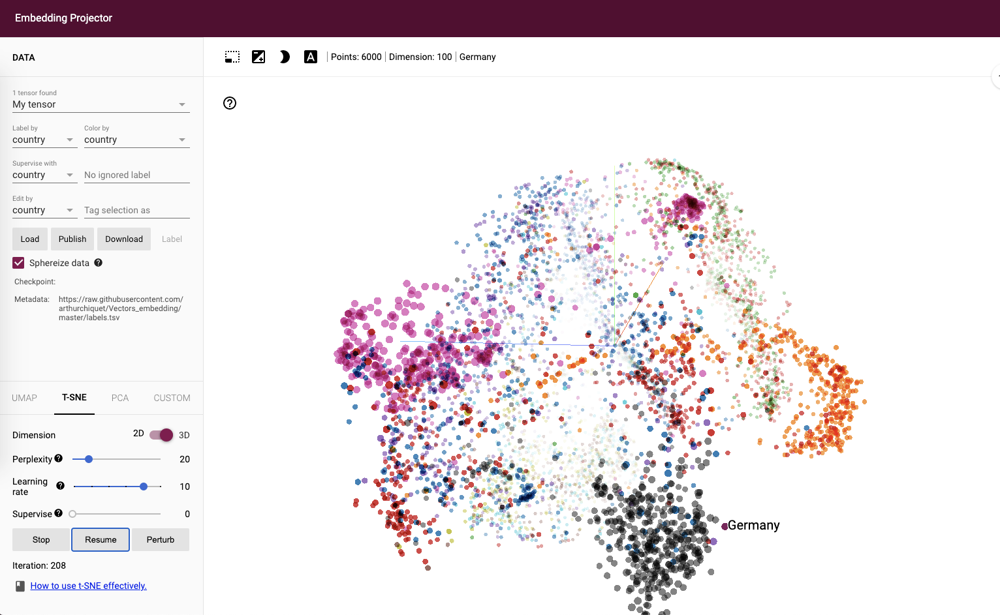

In [ ]:
# To upload data, convert them first as tsv format, then click on "load" directly from the website
spotify_scaled.head(3000).to_csv('spotify.csv', index=False, header=False, sep='\t')
pd.DataFrame(labels).head(3000).to_csv('our_labels.csv', index=False, header=False, sep='\t')

❓ Upload your spotify dataset and vizualize the **PCA** and the **UMAP** version. 
- Also upload your "custom labels" determined previously, and "color by labels".
- Does your "labels" made from PCA look interesting in the UMAP too ?

## (3) (Optional) Bibliography

Theoretical explanations of these best 2D/3D dimensionality reduction techniques
- 📺 [T-SNE: clearly explained (StatsQuest)](https://www.youtube.com/watch?v=NEaUSP4YerM&t=14s)
- 📺 [UMAP: clearly explained (StatsQuest)](https://www.youtube.com/watch?v=eN0wFzBA4Sc)

Spotify resources for projects
- 📺 [Audio Analysis theory with the Spotify Web API](https://www.youtube.com/watch?v=goUzHd7cTuA)
- 🤖 Spotify API [docs](https://developer.spotify.com/documentation/web-api/)
- 🤖 Spotify API Wrappers [Tekore](https://github.com/felix-hilden/tekore) and [Spotipy](https://github.com/plamere/spotipy)